In [1]:
from pathlib import Path
import json
import shutil
import os
import yaml
from ultralytics import YOLO
from IPython.display import Image
from pathlib import Path
from collections import Counter
import pandas as pd
import matplotlib.pyplot as plt
import random
from PIL import Image
import matplotlib.patches as patches
import numpy as np


## 1-PATH VERIFICATION 

The processed dataset already contains the train, test, and valid splits in COCO format. 
We verify that the image folders and annotation files exist before converting the annotations to YOLO label format.

In [2]:
src_root = Path("../Data/lars_processed")        # images
label_root = Path("../Data/lars_relabeled")      # clean COCO labels
yolo_root = Path("../Data/lars_yolo")            # YOLO output

print("Source root:", src_root.resolve())
print("Label root:", label_root.resolve())
print("YOLO root:", yolo_root.resolve())

for split in ["train", "test", "valid"]:
    coco_path = label_root / split / "_annotations.coco.json"
    img_dir = src_root / split / "images"

    print(f"\n{split}")
    print("Clean COCO exists:", coco_path.exists(), "-", coco_path)
    print("Images dir exists:", img_dir.exists(), "-", img_dir)

Source root: /home/ubuntu/AP2026-Maritime-Navigation/Data/lars_processed
Label root: /home/ubuntu/AP2026-Maritime-Navigation/Data/lars_relabeled
YOLO root: /home/ubuntu/AP2026-Maritime-Navigation/Data/lars_yolo

train
Clean COCO exists: True - ../Data/lars_relabeled/train/_annotations.coco.json
Images dir exists: True - ../Data/lars_processed/train/images

test
Clean COCO exists: True - ../Data/lars_relabeled/test/_annotations.coco.json
Images dir exists: True - ../Data/lars_processed/test/images

valid
Clean COCO exists: True - ../Data/lars_relabeled/valid/_annotations.coco.json
Images dir exists: True - ../Data/lars_processed/valid/images



Train set:
Images : 2102
Objects: 8025

Valid set:
Images : 198
Objects: 1119

Test set:
Images : 503
Objects: 1605
Total images in dataset: 2803
Total objects in dataset: 10749

Objects per class:
11 Boat/ship -> 6896
12 Row boats -> 479
13 Paddle board -> 186
14 Buoy -> 1784
15 Swimmer -> 388
16 Animal -> 401
17 Float -> 28
19 Other -> 587


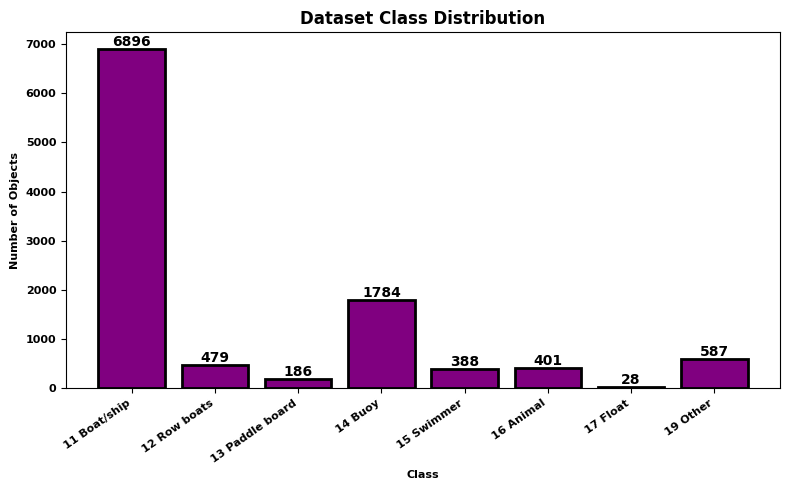

In [3]:
class_counts = Counter()
class_labels = None
total_images = 0
total_objects = 0


for split in ["train", "valid", "test"]:
    
    with open(label_root / split / "_annotations.coco.json", "r", encoding="utf-8") as f:
        data = json.load(f)

    print(f"\n{split.capitalize()} set:")
    print("Images :", len(data["images"]))
    print("Objects:", len(data["annotations"]))
    
    total_images += len(data["images"])
    total_objects += len(data["annotations"])

    for ann in data["annotations"]:
        class_counts[ann["category_id"]] += 1

    if class_labels is None:
        categories = data["categories"]

print("Total images in dataset:", total_images)
print("Total objects in dataset:", total_objects)

print("\nObjects per class:")

class_labels = []
class_values = []

for c in categories:
    count = class_counts[c["id"]]
    print(f"{c['id']} {c['name']} -> {count}")
    
    class_labels.append(f"{c['id']} {c['name']}")
    class_values.append(count)

plt.figure(figsize=(8, 5))

bars = plt.bar(
    class_labels,
    class_values,
    color="purple",
    edgecolor="black",
    linewidth=2
)

for bar, value in zip(bars, class_values):
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height(),
        str(value),
        ha="center",
        va="bottom",
        fontsize=10,
        fontweight="bold"
    )

plt.title("Dataset Class Distribution", fontsize=12, fontweight="bold")
plt.xlabel("Class", fontsize=8, fontweight="bold")
plt.ylabel("Number of Objects", fontsize=8, fontweight="bold")
plt.xticks(rotation=35, ha="right", fontsize=8, fontweight="bold")
plt.yticks(fontsize=8, fontweight="bold")
plt.tight_layout()
plt.show()

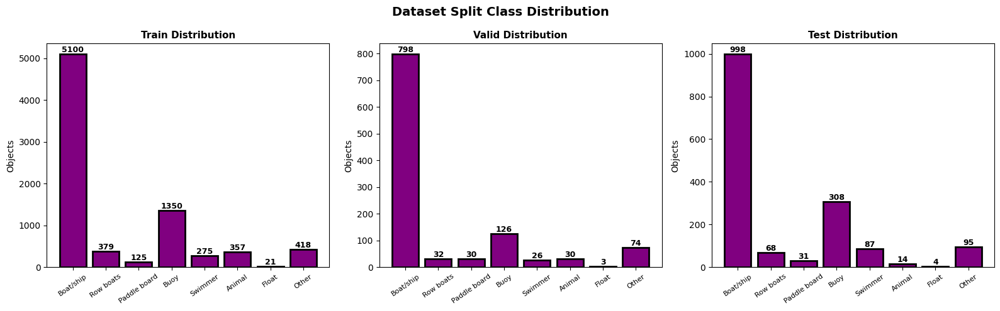

In [4]:
## Dataset Split Class Distribution

splits = ["train", "valid", "test"]

fig, axes = plt.subplots(1, 3, figsize=(16, 5))

for i, split in enumerate(splits):

    with open(label_root / split / "_annotations.coco.json", "r", encoding="utf-8") as f:
        data = json.load(f)

    class_counts = Counter()

    for ann in data["annotations"]:
        class_counts[ann["category_id"]] += 1

    labels = []
    values = []

    for c in data["categories"]:
        labels.append(c["name"])
        values.append(class_counts[c["id"]])

    bars = axes[i].bar(
        labels,
        values,
        color="purple",
        edgecolor="black",
        linewidth=2
    )

    for bar, value in zip(bars, values):
        axes[i].text(
            bar.get_x() + bar.get_width() / 2,
            bar.get_height(),
            str(value),
            ha="center",
            va="bottom",
            fontsize=9,
            fontweight="bold"
        )

    axes[i].set_title(f"{split.capitalize()} Distribution", fontsize=11, fontweight="bold")
    axes[i].tick_params(axis="x", rotation=35, labelsize=8)
    axes[i].set_ylabel("Objects")

plt.suptitle("Dataset Split Class Distribution", fontsize=14, fontweight="bold")
plt.tight_layout()
plt.show()

## 2- CREATING YOLO FOLDERS 

In [5]:
if yolo_root.exists():
    shutil.rmtree(yolo_root)
    
for split in ["train", "valid", "test"]:
    (yolo_root / "images" / split).mkdir(parents=True, exist_ok=True)
    (yolo_root / "labels" / split).mkdir(parents=True, exist_ok=True)

print("YOLO folders created:", yolo_root.exists())

YOLO folders created: True



The folder structure for the YOLO dataset was created. 
YOLO requires annotations in .txt format instead of COCO JSON. 
Therefore, a new dataset structure was created to store the images and the YOLO label files generated from the COCO annotations.

# 3-CONVERT COCO ANNOTATIONS --->> YOLO LABELS (.TXT FORMAT)

The category IDs and class names in the COCO annotations are inspected to understand how classes are encoded in the dataset before converting them to the YOLO label format.

In [6]:
with open(label_root / "train" / "_annotations.coco.json", "r", encoding="utf-8") as f:
    coco = json.load(f)

for c in coco["categories"]:
    print(c["id"], c["name"])

11 Boat/ship
12 Row boats
13 Paddle board
14 Buoy
15 Swimmer
16 Animal
17 Float
19 Other


In [7]:
category_id_to_yolo = {
    11: 0,   # Boat/ship
    12: 1,   # Row boats
    13: 2,   # Paddle board
    14: 3,   # Buoy
    15: 4,   # Swimmer
    16: 5,   # Animal
    17: 6,   # Float
    19: 7    # Other
}

for split in ["train", "valid", "test"]:

    coco_path = label_root / split / "_annotations.coco.json"
    images_dir = src_root / split / "images"

    with open(coco_path, "r", encoding="utf-8") as f:
        coco = json.load(f)

    images = {img["id"]: img for img in coco["images"]}

    anns_per_image = {}
    for ann in coco["annotations"]:
        anns_per_image.setdefault(ann["image_id"], []).append(ann)

    for img_id, img in images.items():

        file_name = img["file_name"]
        width = img["width"]
        height = img["height"]

        src_img = images_dir / file_name
        dst_img = yolo_root / "images" / split / file_name

        if not src_img.exists():
            print("Missing image:", src_img)
            continue

        shutil.copy2(src_img, dst_img)

        label_path = yolo_root / "labels" / split / (Path(file_name).stem + ".txt")

        lines = []

        for ann in anns_per_image.get(img_id, []):

            x, y, w, h = ann["bbox"]

            x_center = (x + w / 2) / width
            y_center = (y + h / 2) / height
            w_norm = w / width
            h_norm = h / height

            class_id = category_id_to_yolo[ann["category_id"]]

            lines.append(
                f"{class_id} {x_center:.6f} {y_center:.6f} {w_norm:.6f} {h_norm:.6f}"
            )

        with open(label_path, "w", encoding="utf-8") as f:
            for line in lines:
                f.write(line + "\n")

print("COCO format to YOLO conversion finished.")

COCO format to YOLO conversion finished.


The COCO annotations are converted into YOLO label format. 
The bounding box coordinates are normalized and the original category IDs are mapped to sequential YOLO class IDs. 
The images and generated label files are then stored in the YOLO dataset structure.

# 4- Checking Generated YOLO Labels

In [8]:
label_dir = yolo_root / "labels" / "train"

files = list(label_dir.glob("*.txt"))

print("Number of label files:", len(files))

for f in files[:5]:
    print("\n", f.name)
    with open(f) as file:
        print(file.read())

Number of label files: 2102

 mit_seq_33_00949.txt
0 0.111719 0.372070 0.107813 0.208984
0 0.945312 0.341797 0.064062 0.183594
0 0.574609 0.360840 0.021094 0.043945


 yt027_03_00109.txt


 yt099_09_00199.txt


 smd_seq06_00030.txt
0 0.177083 0.356944 0.083333 0.049074
0 0.408333 0.228241 0.667708 0.293519
0 0.969010 0.305556 0.061979 0.061111
0 0.823958 0.358796 0.042708 0.021296
0 0.053646 0.272222 0.107292 0.168519


 mastr_0317_00009.txt



The generated YOLO label files are inspected. 
A few label files are opened to verify that the annotations were correctly converted and normalized.

# 5- Create data.yaml

In [9]:
data_config = {
    "path": str(yolo_root.resolve()),
    "train": "images/train",
    "val": "images/valid",
    "test": "images/test",
    "names": {
        0: "Boat/ship",
        1: "Row boats",
        2: "Paddle board",
        3: "Buoy",
        4: "Swimmer",
        5: "Animal",
        6: "Float",
        7: "Other"
    }
}

yaml_path = yolo_root / "data.yaml"

with open(yaml_path, "w", encoding="utf-8") as f:
    yaml.dump(data_config, f, sort_keys=False, allow_unicode=True)

print("data.yaml was created at:")
print(yaml_path.resolve())

data.yaml was created at:
/home/ubuntu/AP2026-Maritime-Navigation/Data/lars_yolo/data.yaml


A data.yaml file was created for YOLO training. 
This file defines the dataset path, the train, valid, and test image folders, and the class names used in the project.


# 6 - Pretrained YOLO Model

## YOLOv8 Model Variants

| Model | Parameters | Speed | Accuracy |
|------|------------|-------|----------|
| YOLOv8n | ~3M | Fastest | Lowest |
| YOLOv8s | ~11M | Fast | Moderate |
| YOLOv8m | ~26M | Medium | Good |
| YOLOv8l | ~44M | Slower | Higher |
| YOLOv8x | ~68M | Slowest | Highest |

For this project, **YOLOv8m** is selected as the main model for fine-tuning. It provides a good balance between detection accuracy and computational cost. Smaller models such as YOLOv8s may train faster but typically achieve lower detection performance on complex datasets.

# 7 - Pretrained Inference on LARS Images

Before fine-tuning, the pretrained YOLOv8m model is applied to a small set of images from the LARS dataset. This step provides a baseline for understanding how the model behaves before domain-specific adaptation.

Since the pretrained model was trained on a general dataset, it may detect some common object types correctly, but it is expected to show weaker performance on maritime-specific categories and small distant objects. The results of this section will later be compared with the fine-tuned model.

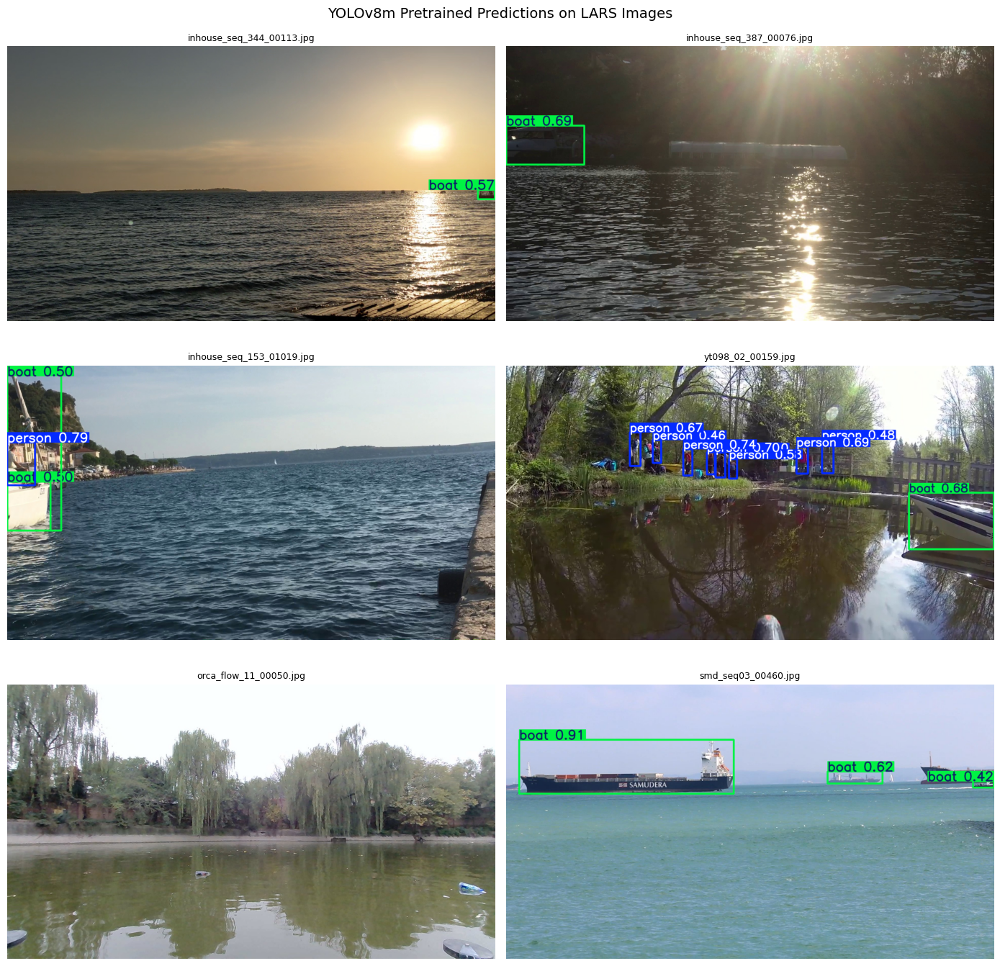

In [ ]:
# Load pretrained YOLO model
model_pretrained = YOLO("yolov8m.pt")

# Select sample images from the validation dataset
img_dir = yolo_root / "images" / "valid"
all_imgs = sorted(img_dir.glob("*.jpg"))

# Fix randomness for reproducibility
random.seed(4)

sample_paths = random.sample(all_imgs, 6)

# Run inference and visualize predictions
fig, axes = plt.subplots(3, 2, figsize=(14, 14))
axes = axes.flatten()

for ax, img_path in zip(axes, sample_paths):

    results = model_pretrained.predict(source=str(img_path), conf=0.4, verbose=False)

    plotted = results[0].plot()[:, :, ::-1]  # convert BGR to RGB

    ax.imshow(plotted)
    ax.set_title(img_path.name, fontsize=9)
    ax.axis("off")

plt.suptitle("YOLOv8m Pretrained Predictions on LARS Images", fontsize=14)
plt.tight_layout()
plt.show()

# 8 -  Fine-Tuning Configuration and Run 


The YOLOv8m model is fine-tuned on the converted LARS dataset using a controlled training setup.

The configuration is chosen to keep the experiment reproducible and reasonably comparable to the RF-DETR experiment. In particular, the same dataset split, validation set, and random seed are used.





### Dataset recap

The training process uses the converted LARS dataset in YOLO format.

- Training images: 2102  
- Validation images: 198  
- Number of object categories: 8

The categories represent common maritime obstacles, including boats, buoys, swimmers, animals, and floating objects.

### Training configuration

| Parameter | Value | Rationale |
|-----------|------|-----------|
| model | YOLOv8m | Balanced accuracy and computational cost |
| epochs | 100 | Short fine-tuning run for experimentation |
| image size | 1024 | for small or distand objects high resolution aimed |
| batch size | 4 | Fits within available GPU memory |
| optimizer | AdamW | Stable modern optimizer |
| seed | 4 | Ensures reproducibility |

The model is initialized with pretrained weights and then fine-tuned on the LARS dataset.

In [12]:
model = YOLO("yolov8m.pt")

results = model.train(
    data=str(yolo_root / "data.yaml"),
    epochs=100,
    imgsz=1024,
    batch=4,
    device=0,
    workers=0,
    seed=4,
    deterministic=True,
    optimizer="AdamW",
    lr0=0.001,
    weight_decay=0.0001,
    pretrained=True,
    project="runs/detect",
    name="exp7_yolov8m_ep100_img1024_b4",
    exist_ok=False,
    plots=True
)

run_dir = Path(results.save_dir)
print("Run directory:", run_dir.resolve())

New https://pypi.org/project/ultralytics/8.4.48 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.4.46 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A40, 45416MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=../Data/lars_yolo/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=1024, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8m.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=exp

AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1524.8±627.9 MB/s, size: 245.9 KB)
train: Scanning /home/ubuntu/AP2026-Maritime-Navigation/Data/lars_yolo/labels/train... 2102 images, 461 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 2102/2102 423.1it/s 5.0s0.0s
train: New cache created: /home/ubuntu/AP2026-Maritime-Navigation/Data/lars_yolo/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1944.3±414.8 MB/s, size: 394.2 KB)
val: Scanning /home/ubuntu/AP2026-Maritime-Navigation/Data/lars_yolo/labels/valid... 198 images, 41 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 198/198 398.8it/s 0.5s0.1s
val: New cache created: /home/ubuntu/AP2026-Maritime-Navigation/Data/lars_yolo/labels/valid.cache
optimizer: AdamW(lr=0.001, momentum=0.937) with par

# 9 - Training Results

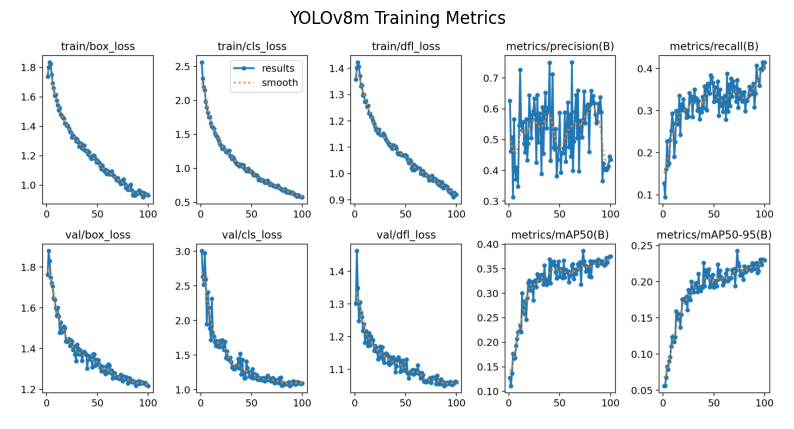

In [13]:
results_img = run_dir / "results.png"

img = Image.open(results_img)

plt.figure(figsize=(10, 6))
plt.imshow(img)
plt.axis("off")
plt.title("YOLOv8m Training Metrics")
plt.show()

In [14]:
results_csv = run_dir / "results.csv"

df = pd.read_csv(results_csv)

best_row = df.loc[df["metrics/mAP50-95(B)"].idxmax()]

best_results = pd.DataFrame({
    "Metric": [
        "Precision",
        "Recall",
        "mAP@0.5",
        "mAP@0.5:0.95"
    ],
    "Value": [
        best_row["metrics/precision(B)"],
        best_row["metrics/recall(B)"],
        best_row["metrics/mAP50(B)"],
        best_row["metrics/mAP50-95(B)"]
    ]
})

best_results

,Metric,Value
0,Precision,0.56507
1,Recall,0.37237
2,mAP@0.5,0.38649
3,mAP@0.5:0.95,0.24262


In [15]:
from PIL import Image
from collections import Counter

img_dir = yolo_root / "images" / "train"

sizes = []

for img_path in img_dir.glob("*.jpg"):
    img = Image.open(img_path)
    sizes.append(img.size)   # (width, height)

# Most common resolutions
size_counts = Counter(sizes)

print("Most common image sizes:\n")

for size, count in size_counts.most_common(10):
    print(f"{size} -> {count} images")

Most common image sizes:

(1278, 958) -> 1056 images
(1920, 1080) -> 408 images
(1280, 720) -> 356 images
(2208, 1242) -> 117 images
(640, 480) -> 60 images
(640, 400) -> 49 images
(1280, 1024) -> 48 images
(1280, 702) -> 3 images
(1280, 676) -> 3 images
(1920, 1440) -> 2 images


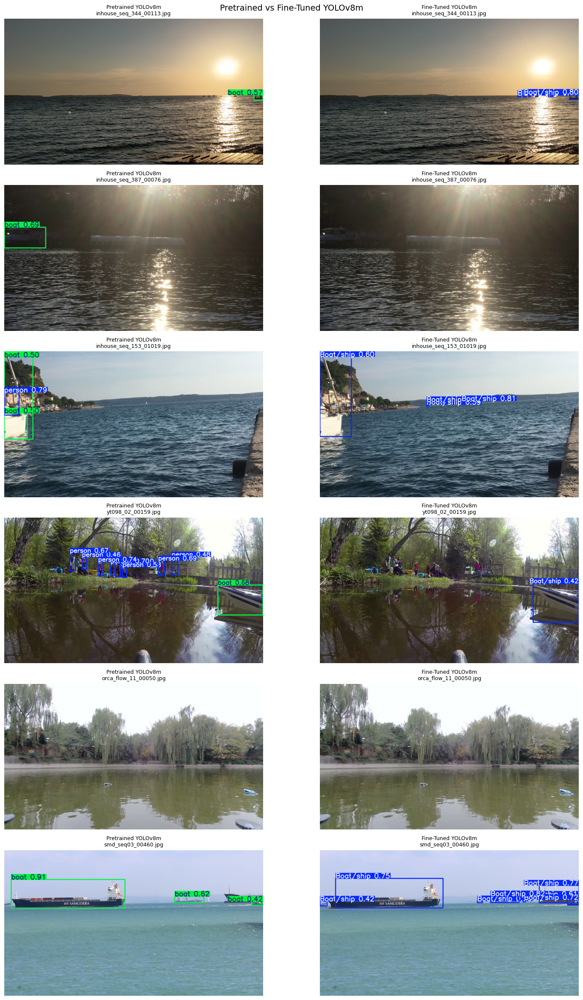

In [16]:
# Load models
model_pretrained = YOLO("yolov8m.pt")
model_finetuned = YOLO(run_dir / "weights" / "best.pt")

# Select validation images
img_dir = yolo_root / "images" / "valid"
all_imgs = sorted(img_dir.glob("*.jpg"))

random.seed(4)
sample_paths = random.sample(all_imgs, 6)

# Create comparison figure
fig, axes = plt.subplots(len(sample_paths), 2, figsize=(16, 4 * len(sample_paths)))

for row, img_path in enumerate(sample_paths):

    # Pretrained predictions
    results_pre = model_pretrained.predict(source=str(img_path), conf=0.4, verbose=False)
    plotted_pre = results_pre[0].plot()[:, :, ::-1]

    # Fine-tuned predictions
    results_ft = model_finetuned.predict(source=str(img_path), conf=0.4, verbose=False)
    plotted_ft = results_ft[0].plot()[:, :, ::-1]

    axes[row, 0].imshow(plotted_pre)
    axes[row, 0].set_title(f"Pretrained YOLOv8m\n{img_path.name}", fontsize=9)
    axes[row, 0].axis("off")

    axes[row, 1].imshow(plotted_ft)
    axes[row, 1].set_title(f"Fine-Tuned YOLOv8m\n{img_path.name}", fontsize=9)
    axes[row, 1].axis("off")

plt.suptitle("Pretrained vs Fine-Tuned YOLOv8m", fontsize=14)
plt.tight_layout()
plt.show()



To further evaluate the model performance, the predictions of the fine-tuned YOLOv8m model are compared with the ground-truth annotations from the validation dataset.

Ground-truth bounding boxes represent the labeled objects in the dataset, while the model predictions show what the trained detector identifies in the same images. This comparison helps assess how accurately the model localizes and classifies maritime obstacles.

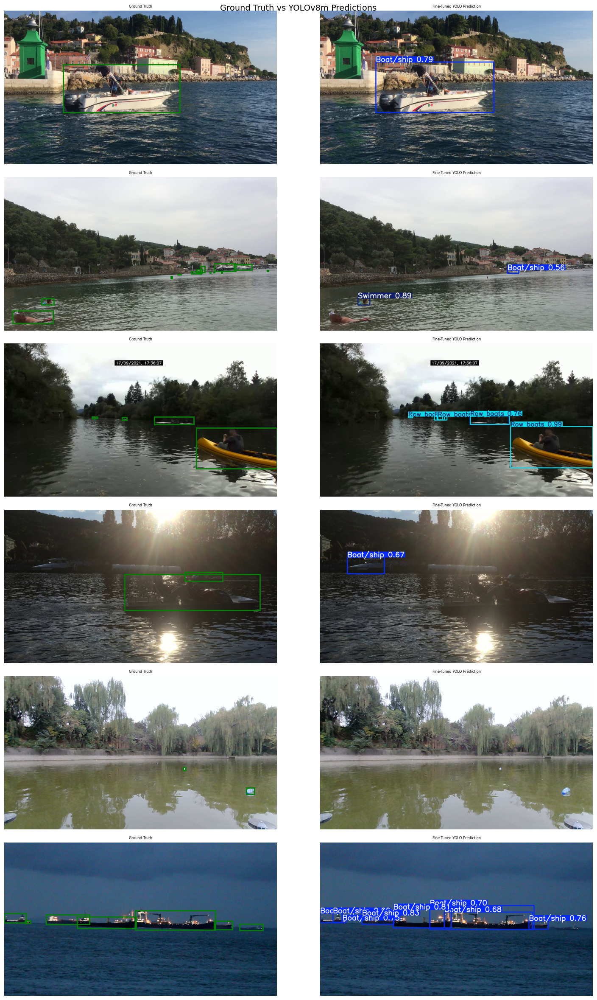

In [17]:
# Load fine-tuned model
model_ft = YOLO(run_dir / "weights" / "best.pt")

# Load validation annotations from CLEAN relabeled labels
ann_path = label_root / "valid" / "_annotations.coco.json"

with open(ann_path, "r", encoding="utf-8") as f:
    ann_data = json.load(f)

# Build image dictionary
images = {img["id"]: img for img in ann_data["images"]}

# Group annotations by image
anns_per_image = {}
for ann in ann_data["annotations"]:
    anns_per_image.setdefault(ann["image_id"], []).append(ann)

# Sample validation images
random.seed(4)
sample_ids = random.sample(list(images.keys()), 6)

fig, axes = plt.subplots(len(sample_ids), 2, figsize=(16, 4 * len(sample_ids)))

for row, img_id in enumerate(sample_ids):

    img_info = images[img_id]
    img_path = src_root / "valid" / "images" / img_info["file_name"]

    img = Image.open(img_path).convert("RGB")

    # Ground Truth
    ax = axes[row, 0]
    ax.imshow(img)
    ax.set_title("Ground Truth", fontsize=6)
    ax.axis("off")

    for ann in anns_per_image.get(img_id, []):
        x, y, w, h = ann["bbox"]

        rect = patches.Rectangle(
            (x, y), w, h,
            linewidth=2,
            edgecolor="green",
            facecolor="none"
        )
        ax.add_patch(rect)

    # Model Prediction
    ax2 = axes[row, 1]

    results = model_ft.predict(source=str(img_path), conf=0.4, verbose=False)
    plotted = results[0].plot()[:, :, ::-1]

    ax2.imshow(plotted)
    ax2.set_title("Fine-Tuned YOLO Prediction", fontsize=6)
    ax2.axis("off")

plt.suptitle("Ground Truth vs YOLOv8m Predictions", fontsize=14)
plt.tight_layout()
plt.show()

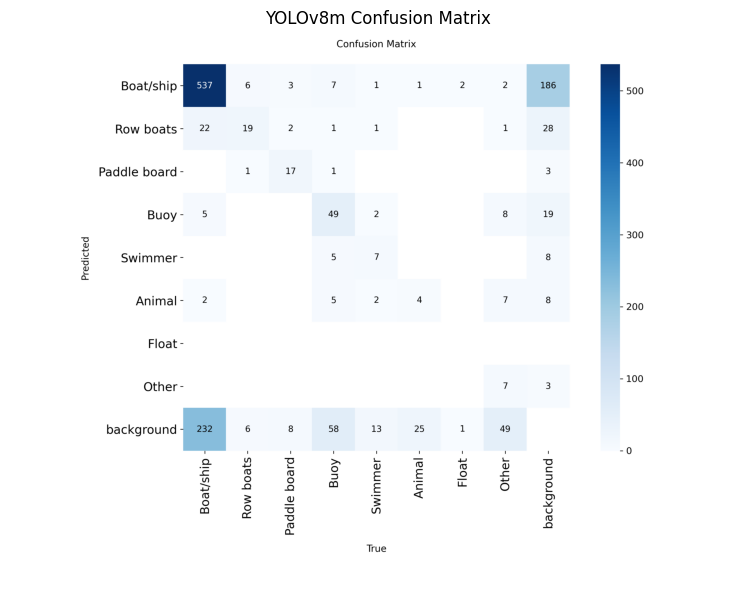

In [18]:
cm_path = run_dir / "confusion_matrix.png"

img = Image.open(cm_path)

plt.figure(figsize=(9.5,9.5))
plt.imshow(img)
plt.axis("off")
plt.title("YOLOv8m Confusion Matrix")
plt.show()



### Confusion Matrix – Key Observations

- **Boat/ship** has the highest number of correct detections (309), but it also has a large number of missed objects (471).
- **Buoy** has some correct detections (22), but many buoy objects are still missed (97).
- Classes such as **Swimmer**, **Animal**, **Float**, and **Other** could not detected (0).
- The main issue of the model is **missed detections**, rather than strong confusion between classes.

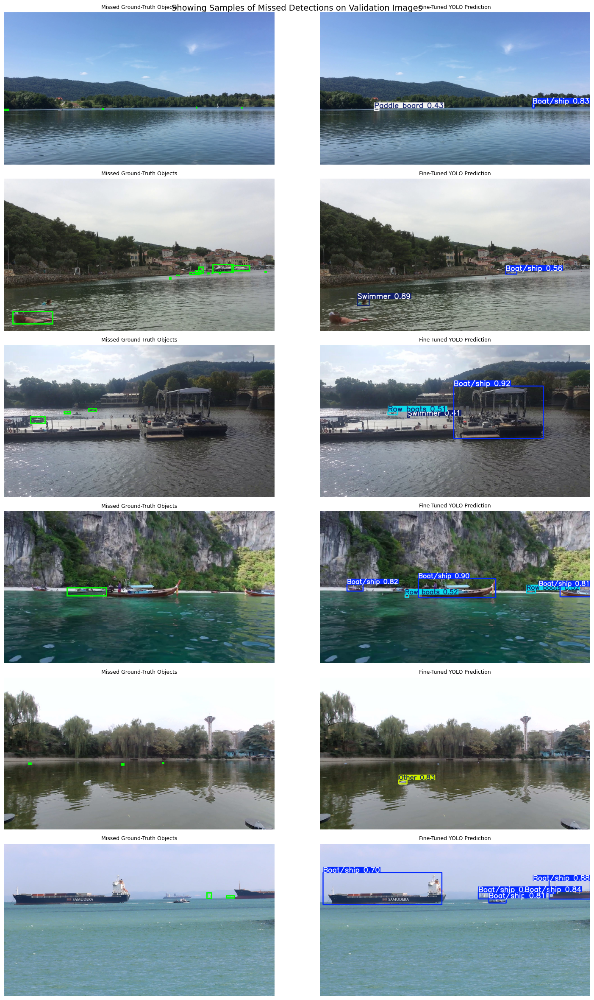

In [19]:
# Build image dictionary
images = {img["id"]: img for img in ann_data["images"]}

# Group annotations by image
anns_per_image = {}
for ann in ann_data["annotations"]:
    anns_per_image.setdefault(ann["image_id"], []).append(ann)

# Class names
cat_id_to_name = {c["id"]: c["name"] for c in ann_data["categories"]}

def box_iou_xyxy(box1, box2):
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    inter_w = max(0, x2 - x1)
    inter_h = max(0, y2 - y1)
    inter = inter_w * inter_h

    area1 = max(0, box1[2] - box1[0]) * max(0, box1[3] - box1[1])
    area2 = max(0, box2[2] - box2[0]) * max(0, box2[3] - box2[1])

    union = area1 + area2 - inter
    return inter / union if union > 0 else 0

# Find images with missed detections
missed_examples = []

for img_id, img_info in images.items():
    img_path = src_root / "valid" / "images" / img_info["file_name"]
    gt_anns = anns_per_image.get(img_id, [])

    if not gt_anns:
        continue

    # Ground-truth boxes in xyxy
    gt_boxes = []
    gt_labels = []
    for ann in gt_anns:
        x, y, w, h = ann["bbox"]
        gt_boxes.append([x, y, x + w, y + h])
        gt_labels.append(cat_id_to_name[ann["category_id"]])

    # Model predictions
    results = model_ft.predict(source=str(img_path), conf=0.4, verbose=False)
    pred_boxes = results[0].boxes.xyxy.cpu().numpy() if results[0].boxes is not None and len(results[0].boxes) > 0 else np.empty((0, 4))

    missed_gt = []

    for gt_box, gt_label in zip(gt_boxes, gt_labels):
        matched = False
        for pred_box in pred_boxes:
            if box_iou_xyxy(gt_box, pred_box) >= 0.5:
                matched = True
                break
        if not matched:
            missed_gt.append((gt_box, gt_label))

    if missed_gt:
        missed_examples.append((img_path, missed_gt, results))

# Show a few examples
random.seed(4)
n_show = min(6, len(missed_examples))
samples = random.sample(missed_examples, n_show)

fig, axes = plt.subplots(n_show, 2, figsize=(16, 4 * n_show))

if n_show == 1:
    axes = np.array([axes])

for row, (img_path, missed_gt, results) in enumerate(samples):
    img = Image.open(img_path).convert("RGB")
    img_array = np.array(img)

    # Left: missed ground-truth objects
    ax1 = axes[row, 0]
    ax1.imshow(img_array)
    ax1.set_title("Missed Ground-Truth Objects", fontsize=9)
    ax1.axis("off")

    for gt_box, gt_label in missed_gt:
        x1, y1, x2, y2 = gt_box
        rect = patches.Rectangle(
            (x1, y1), x2 - x1, y2 - y1,
            linewidth=2,
            edgecolor="lime",
            facecolor="none"
        )
        ax1.add_patch(rect)
    

    # Right: model predictions
    ax2 = axes[row, 1]
    plotted = results[0].plot()[:, :, ::-1]
    ax2.imshow(plotted)
    ax2.set_title("Fine-Tuned YOLO Prediction", fontsize=9)
    ax2.axis("off")

plt.suptitle("Showing Samples of Missed Detections on Validation Images", fontsize=14)
plt.tight_layout()
plt.show()

### Test Set Evaluation
The trained YOLOv8m model is evaluated on the held-out test split.  
This evaluation measures the generalization ability of the model on unseen data and reports detection performance using standard object detection metrics.

In [20]:


# Load best trained model
model_best = YOLO(run_dir / "weights" / "best.pt")

# Validation metrics
val_metrics = model_best.val(
    data=str(yolo_root / "data.yaml"),
    split="val",
    verbose=False
)

# Test metrics
test_metrics = model_best.val(
    data=str(yolo_root / "data.yaml"),
    split="test",
    verbose=False
)

print(f"{'Metric':<18} {'Val':>8} {'Test':>8}")
print("-" * 36)
print(f"{'mAP@50':<18} {val_metrics.box.map50:>8.4f} {test_metrics.box.map50:>8.4f}")
print(f"{'mAP@50:95':<18} {val_metrics.box.map:>8.4f} {test_metrics.box.map:>8.4f}")
print(f"{'Precision':<18} {val_metrics.box.mp:>8.4f} {test_metrics.box.mp:>8.4f}")
print(f"{'Recall':<18} {val_metrics.box.mr:>8.4f} {test_metrics.box.mr:>8.4f}")

Ultralytics 8.4.46 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A40, 45416MiB)
Model summary (fused): 93 layers, 25,844,392 parameters, 0 gradients, 78.7 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2183.1±116.4 MB/s, size: 422.1 KB)
val: Scanning /home/ubuntu/AP2026-Maritime-Navigation/Data/lars_yolo/labels/valid.cache... 198 images, 41 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 198/198 19.3Mit/s 0.0s


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 13/13 2.7it/s 4.8s0.2s
                   all        198       1119      0.553      0.382      0.387      0.244
Speed: 3.7ms preprocess, 10.5ms inference, 0.0ms loss, 2.2ms postprocess per image
Results saved to /home/ubuntu/AP2026-Maritime-Navigation/4_Model/runs/detect/val-11
Ultralytics 8.4.46 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A40, 45416MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 5.5±3.5 MB/s, size: 134.6 KB)
val: Scanning /home/ubuntu/AP2026-Maritime-Navigation/Data/lars_yolo/labels/test... 503 images, 96 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 503/503 329.2it/s 1.5s0.0s
val: New cache created: /home/ubuntu/AP2026-Maritime-Navigation/Data/lars_yolo/labels/test.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 32/32 3.8it/s 8.5s0.2s
                   all        503       1605      0.5